In [1]:
import os, re
import random, math
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

c:\Users\Desk_Kang\anaconda3\envs\pyenv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
(raw_train, raw_val, raw_test), info = tfds.load('tf_flowers', split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'], download=True, with_info=True)

In [1]:
#사진 데이터 불러와서 train, validation, test 로 나누어 저장함

In [3]:
print(raw_train)
print(raw_val)
print(raw_test)

<PrefetchDataset element_spec={'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>
<PrefetchDataset element_spec={'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>
<PrefetchDataset element_spec={'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>


In [4]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


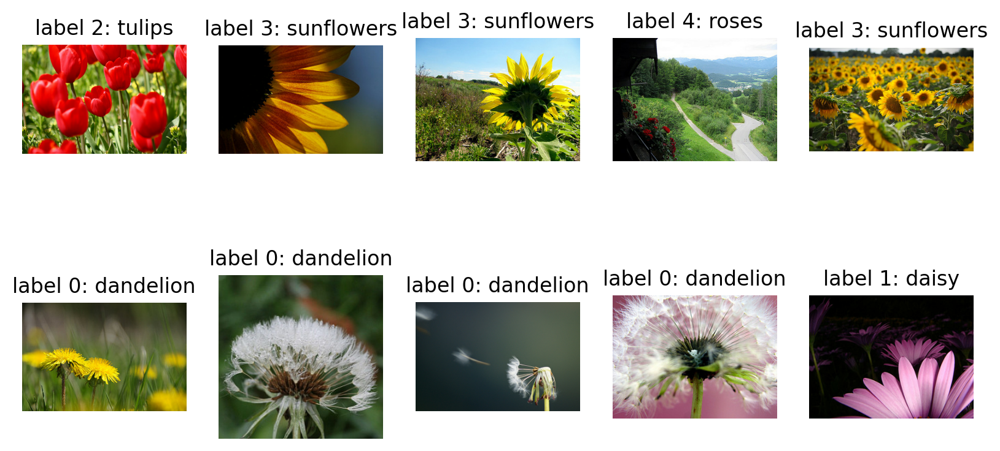

In [5]:
plt.figure(figsize=(10, 5))

get_label_name = info.features['label'].int2str

for idx, data in enumerate(raw_train.take(10)):
    image = data['image']
    label = data['label']

    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

plt.show()

In [6]:
IMG_SIZE = 220 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5)-1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label


In [3]:
#이미지 픽셀의 데이터는 0~255 숫자를 가지고 있어 /255 혹은 (/127.5)-1 스케일링함
#여기서는 후자 선택

In [7]:
train = raw_train.map(lambda x: format_example(x['image'], x['label']))
validation = raw_val.map(lambda x: format_example(x['image'], x['label']))
test = raw_test.map(lambda x: format_example(x['image'], x['label']))

print(train)
print(validation)
print(test)

<MapDataset element_spec=(TensorSpec(shape=(220, 220, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(220, 220, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(220, 220, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [4]:
#데이터와 라벨링 작업

In [8]:
print(len(train))
print(len(test))
print(len(validation))

2936
367
367


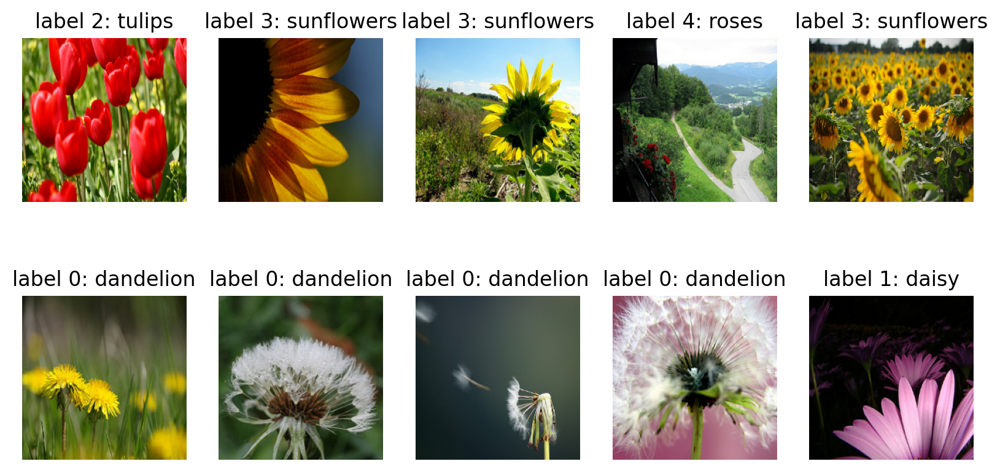

In [9]:
plt.figure(figsize=(10, 5))


get_label_name = info.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [10]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

base_model = tf.keras.applications.VGG19(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [11]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE_T = 1050
SHUFFLE_BUFFER_SIZE_A = 120

In [5]:
#shuffle buffer size가 원 데이터의 10%~100%가 적당하다는데
#pneu에서는 훨씬 큰 숫자를 줘야 했음
#여기선 30%정도 부여

In [12]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE_T).batch(BATCH_SIZE)
validation_batches = validation.shuffle(SHUFFLE_BUFFER_SIZE_A).batch(BATCH_SIZE)
test_batches = test.shuffle(SHUFFLE_BUFFER_SIZE_A).batch(BATCH_SIZE)

In [14]:
base_model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 220, 220, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 220, 220, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 220, 220, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 110, 110, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 110, 110, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 110, 110, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 55, 55, 128)       0     

In [15]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [16]:
dense_layer = tf.keras.layers.Dense(1024, activation='relu')
dropout_layer = tf.keras.layers.Dropout(0.3)
dense_layer2 = tf.keras.layers.Dense(512, activation='relu')
dense_layer3 = tf.keras.layers.Dense(512, activation='relu')

In [6]:
#layer를 더 쌓으면 학습데이터에 맞출 수 있을까 해서
#3개 쌓아봄

In [17]:
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

In [18]:
base_model.trainable = False

In [19]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  dropout_layer,
  dense_layer2,
  dense_layer3,
  prediction_layer
])

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 6, 6, 512)         20024384  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 1024)              525312    
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 512)               262656    
                                                        

In [21]:
learning_rate = 0.0001
EPOCHS = 35
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [22]:
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("flowers_model.h5",
                                                    save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=5,
                                                     restore_best_weights=True)

In [23]:
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/35
92/92 [==============================] - 25s 184ms/step - loss: 1.2444 - accuracy: 0.5347 - val_loss: 0.8841 - val_accuracy: 0.6975
Epoch 2/35
92/92 [==============================] - 11s 116ms/step - loss: 0.8236 - accuracy: 0.7027 - val_loss: 0.6925 - val_accuracy: 0.7629
Epoch 3/35
92/92 [==============================] - 11s 112ms/step - loss: 0.6938 - accuracy: 0.7452 - val_loss: 0.6927 - val_accuracy: 0.7520
Epoch 4/35
92/92 [==============================] - 11s 117ms/step - loss: 0.6227 - accuracy: 0.7660 - val_loss: 0.5927 - val_accuracy: 0.7847
Epoch 5/35
92/92 [==============================] - 11s 117ms/step - loss: 0.5756 - accuracy: 0.7830 - val_loss: 0.5413 - val_accuracy: 0.8202
Epoch 6/35
92/92 [==============================] - 11s 113ms/step - loss: 0.5346 - accuracy: 0.8082 - val_loss: 0.6129 - val_accuracy: 0.7602
Epoch 7/35
92/92 [==============================] - 11s 116ms/step - loss: 0.4970 - accuracy: 0.8215 - val_loss: 0.5014 - val_accuracy: 0.8365

In [24]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

1/1 [==============================] - 0s 202ms/step


array([[4.89920669e-04, 1.30022469e-04, 2.09923953e-01, 2.46328302e-03,
        7.86992848e-01],
       [1.71026975e-01, 1.88578352e-01, 5.09175539e-01, 1.35693951e-02,
        1.17649823e-01],
       [2.04017968e-03, 9.91897702e-01, 3.52978212e-04, 5.63761778e-03,
        7.15596325e-05],
       [8.30120500e-03, 7.51169631e-03, 7.31487274e-02, 4.08735931e-01,
        5.02302468e-01],
       [9.97656107e-01, 2.20615859e-03, 2.54770475e-05, 7.45085126e-05,
        3.77176111e-05],
       [2.55883485e-03, 9.72438790e-03, 5.18202176e-03, 9.81884420e-01,
        6.50378468e-04],
       [1.55542220e-03, 6.05315685e-01, 1.73737869e-01, 2.10017800e-01,
        9.37328674e-03],
       [4.56371725e-01, 5.27103603e-01, 1.54361932e-03, 1.22488821e-02,
        2.73214001e-03],
       [9.99961853e-01, 2.81717184e-05, 1.80210620e-07, 8.86651924e-06,
        9.27079270e-07],
       [9.64826524e-01, 3.17374319e-02, 1.43702596e-03, 1.57498557e-03,
        4.23930527e-04],
       [5.98603438e-05, 5.7599

In [25]:
predictions = np.argmax(predictions, axis=1)
predictions

array([4, 2, 1, 4, 0, 3, 1, 1, 0, 0, 3, 4, 1, 1, 0, 0, 1, 3, 1, 4, 4, 4,
       2, 0, 1, 3, 3, 4, 1, 4, 2, 2], dtype=int64)

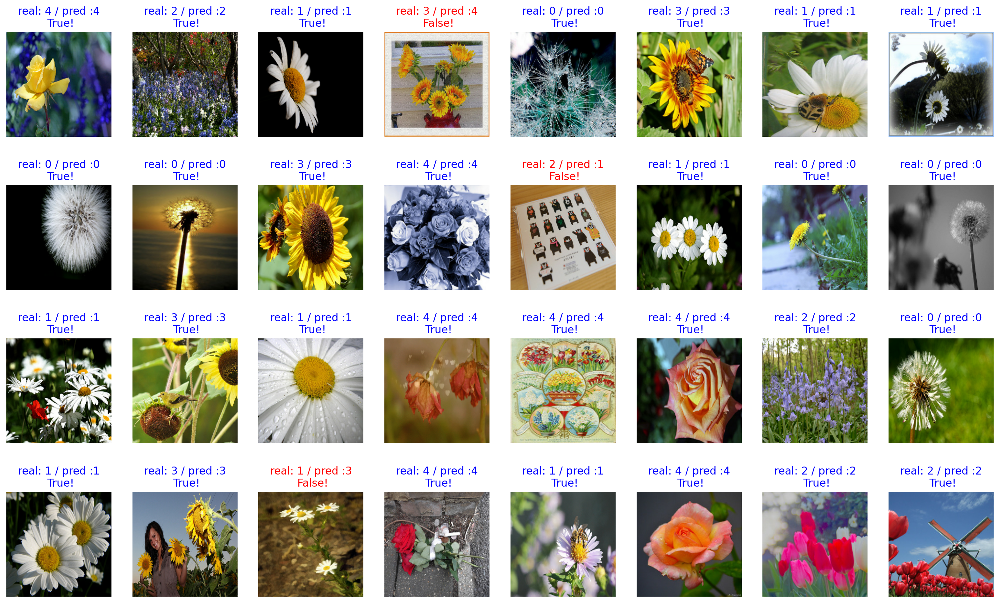

In [26]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [27]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

90.625


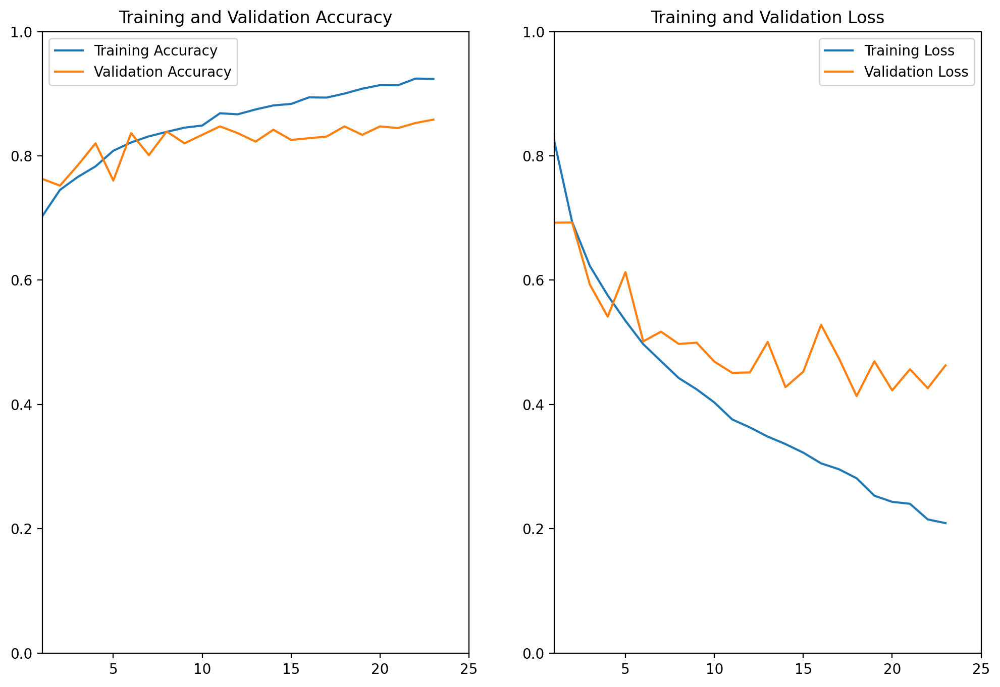

In [31]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(24)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.ylim([0, 1])
plt.xlim([1, 25])

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.ylim([0, 1])
plt.xlim([1, 25])

plt.show()

In [32]:
test_loss, test_accuracy = model.evaluate(test_batches)

12/12 [==============================] - 2s 110ms/step - loss: 0.4211 - accuracy: 0.8610


In [36]:
print(f'Loss: {test_loss},\nAccuracy: {test_accuracy}')

Loss: 0.42108452320098877,
Accuracy: 0.8610354065895081


In [1]:
#test_accuracy가 약 0.86으로 86% 정확도를 보여줌

In [8]:
#여러 파라미터 중 Epoch은 10~35로 다양하게 나타나서 35까지 주고 다른 파라미터 변화를 줌
#dense_layer를 처음엔 512짜리 2개만 쌓았다가, flower에 더 치우치도록 3개와 dropdout까지 쌓아봄
#처음엔 shuffle buffer size를 train만 10% 줬는데, validation과 test까지 포함하여 30%까지 바꾸어봄
#생각보다 85% 넘기기가 힘들다는걸... 느낌
#학습 데이터 전처리에서 다양성을 주는 방법을 더 찾아보아야겠음(노드에서 좌우반전 회전을 배웠음)
